Diabetes

This notebook is based on the following dataset: https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset

The table consists of the following variables:

* ID - Patient ID
* Diabetes_binary - 0=no diabetes, 1=prediabetes or diabetes
* HighBP - 0=no high BP, 1=high BP
* HighChol - 0=no high cholesterol, 1=high cholesterol
* CholCheck - 0=no cholesterol check in 5 years, 1=yes cholesterol check in 5 years
* BMI - Body Mass Index
* Smoker - Have you smoked at least 100 cigarettes (around 5 packs) in your entire life?: 0=no, 1=yes
* Stroke - (Ever told) you had a stroke: 0=no, 1=yes
* HeartDiseaseorAttack - coronary heart disease(CHD) or myocardial infarction(MI): 0 = no 1 = yes
* PhysActivity - physical activity in past 30 days - not including job: 0 = no 1 = yes
* Fruits - Consume Fruit 1 or more times per day: 0 = no 1 = yes
* Veggies - Consume Vegetables 1 or more times per day: 0 = no 1 = yes
* HvyAlcoholConsump - Heavy drinkers (adult men having more than 14 drinks per week and adult women having more than 7 drinks per week): 0 = no 1 = yes
* AnyHealthcare - Have any kind of health care coverage, including health insurance, prepaid plans such as HMO, etc: 0 = no 1 = yes
* NoDocbcCost - Was there a time in the past 12 months when you needed to see a doctor but could not because of cost?: 0 = no 1 = yes	
* GenHlth - Would you say that in general your health is: scale 1-5 1 = excellent 2 = very good 3 = good 4 = fair 5 = poor
* MentHlth - Now thinking about your mental health, which includes stress, depression, and problems with emotions, for how many days during the past 30 days was your mental health not good? scale 1-30 days	
* PhysHlth - Now thinking about your physical health, which includes physical illness and injury, for how many days during the past 30 days was your physical health not good? scale 1-30 days
* DiffWalk - Do you have serious difficulty walking or climbing stairs? 0 = no 1 = yes
* Sex - 0=female, 1=male
* Age - 13-level age category (_AGEG5YR see codebook) 1 = 18-24 9 = 60-64 13 = 80 or older	
* Education - Education level (EDUCA see codebook) scale 1-6 1 = Never attended school or only kindergarten 2 = Grades 1 through 8 (Elementary) 3 = Grades 9 through 11 (Some high school) 4 = Grade 12 or GED (High school graduate) 5 = College 1 year to 3 years (Some college or technical school) 6 = College 4 years or more (College graduate)
* Income - Income scale (INCOME2 see codebook) scale 1-8 1 = less than $10,000 5 = less than $35,000 8 = $75,000 or more

Initialization

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import FunctionTransformer
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from pandas import DataFrame

Preprocessing

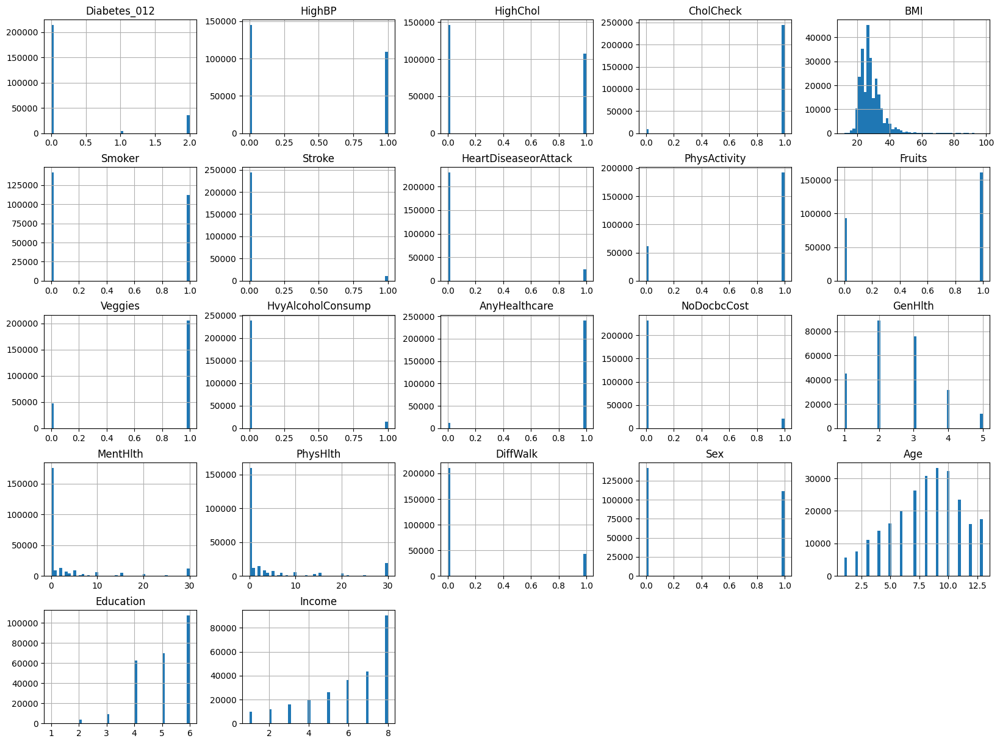

In [44]:
df_diabetes = pd.read_csv('diabetes_health_indicators.csv')

df_diabetes.isnull().sum()

df_diabetes.hist(bins=50, figsize=(20,15))
plt.show()

""" sns.boxplot(df_diabetes['Education'])
 """
fig = px.box(df_diabetes, y="Education")
fig.show()

fig = px.box(df_diabetes, y="MentHlth")
fig.show()

fig = px.box(df_diabetes, y="GenHlth")
fig.show()

df_diabetes['GenHlth'].value_counts()

df_diabetes.drop_duplicates(inplace = True)
df_diabetes["BMI"] = np.log(df_diabetes["BMI"])


Feature Scaling

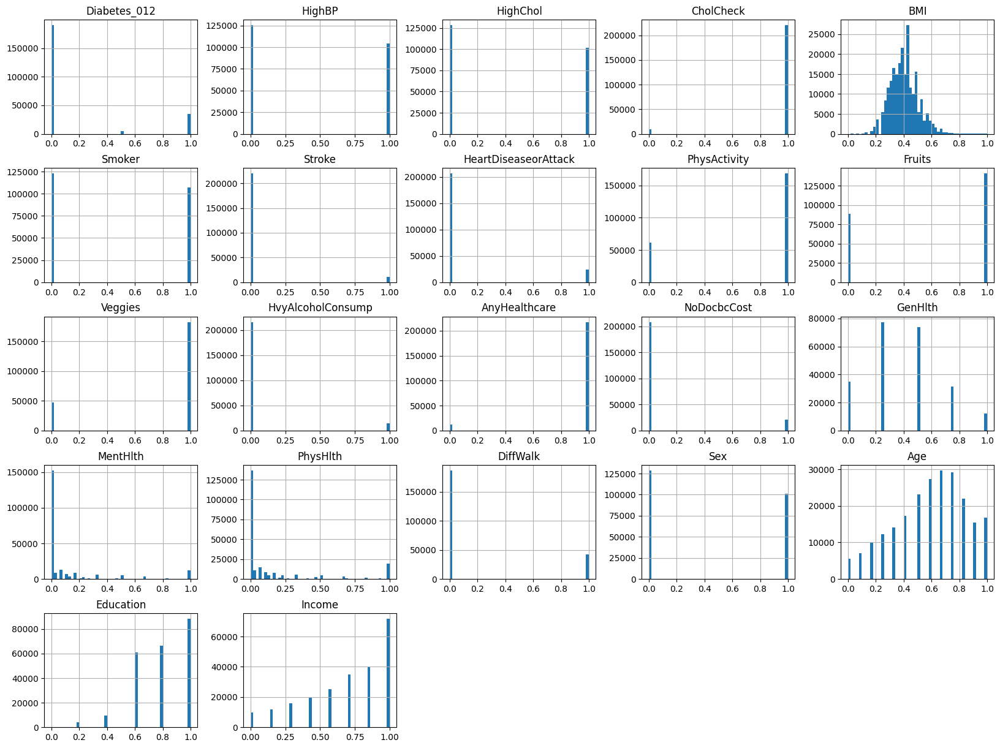

In [46]:
min_max_scaler = MinMaxScaler()
df_diabetes_scaled = min_max_scaler.fit_transform(df_diabetes)


df_diabetes = DataFrame(df_diabetes_scaled, columns=df_diabetes.columns)

df_diabetes.hist(bins=50, figsize=(20,15))
plt.show()


EDA

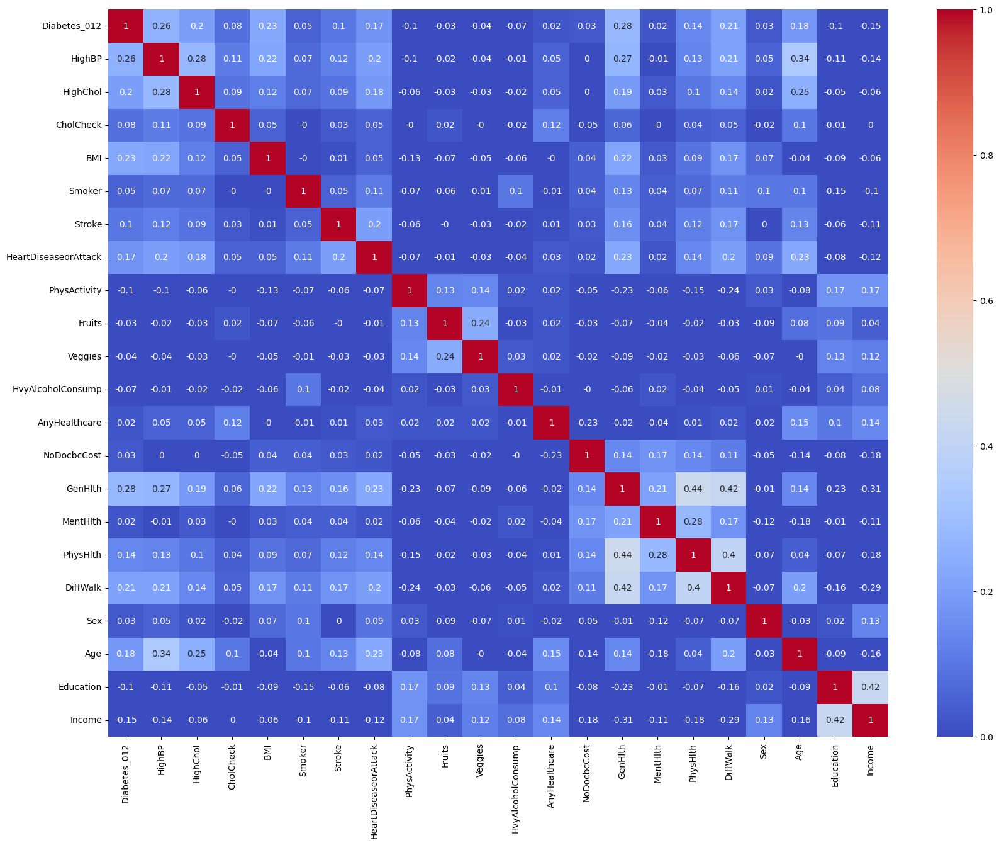

<Axes: xlabel='Education', ylabel='Income'>

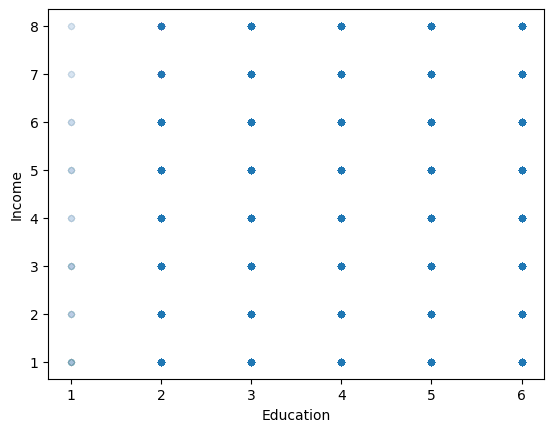

In [18]:
corr_matrix = df_diabetes.corr(method="spearman").round(2)
plt.figure(figsize=(20,15))
sns.heatmap(corr_matrix, cmap="coolwarm", vmin=0, vmax=1, annot=True)
plt.show()

df_diabetes.plot(kind="scatter", y="Income", x="Education", alpha=0.01)